### Making CSV file for running Saturn

In [73]:
import pandas as pd

In [7]:
df = pd.DataFrame(columns=["path", "species", "embedding_path"])
df["species"]=["zebrafish", "mouse"]
df["path"] = ["data/zebra.h5ad", "data/mouse.h5ad"]

zebrafish_embedding_path = "/DATAFILES/Cross_species/protein_embeddings/ESM2/zebrafish_embedding.torch"
mouse_embedding_path = "/DATAFILES/Cross_species/protein_embeddings/ESM2/mouse_embedding.torch"

df["embedding_path"] = [zebrafish_embedding_path, mouse_embedding_path]
df.to_csv("data/zebrafish_mouse_run.csv", index=False)
df

,path,species,embedding_path
0,data/zebra.h5ad,zebrafish,/DATAFILES/Cross_species/protein_embeddings/ES...
1,data/mouse.h5ad,mouse,/DATAFILES/Cross_species/protein_embeddings/ES...


#### Reading the scoring files

In [52]:
data=pd.read_csv("data/fish_mouse_cell_type_map.csv")
data

,Unnamed: 0,mouse_cell_type,zebrafish_cell_type
0,0,Microglia,Microglia
1,1,Immune,NaN
2,2,Endothelial,NaN
3,3,Ependymal,Ependymal
4,4,OPCs,OPCs
5,5,Pericytes,Pericytes
6,6,DivMyeloid,DivMyeloid
7,7,Astrocytes,Astrocytes
8,8,Oligodendrocytes,Oligodendrocytes
9,9,NaN,Macrophage


### Preparing Anndata for analysis

In [7]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
from anndata import AnnData, read_csv

In [18]:
zebrafish = sc.read('data/zebra.h5ad')
zebrafish

AnnData object with n_obs × n_vars = 81893 × 32221
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Timepoint', 'integrated_snn_res.0.4', 'seurat_clusters', 'pANN_0.25_0.29_4310', 'DF.classifications_0.25_0.29_4310', 'Coarse.Cluster.ID', 'Fine.Cluster.ID', 'Fine.Cluster.ID.Timepoint', 'Coarse.Cluster.ID.Timepoint', 'cell_type'
    var: 'features'

In [19]:
zebrafish.obs['cell_type']

AAACCCAAGTATGGCG-1_1           Microglia
AAACCCAAGTCATCGT-1_1             Neurons
AAACCCACAGACAAAT-1_1             Neurons
AAACCCACAGACTGCC-1_1             Neurons
AAACCCACATTCACAG-1_1           Microglia
                              ...       
TTTGTTGGTATTGCCA-1_9           Ependymal
TTTGTTGGTTAAACCC-1_9    Oligodendrocytes
TTTGTTGGTTACCCTC-1_9             Neurons
TTTGTTGTCCACCTGT-1_9    Oligodendrocytes
TTTGTTGTCGCTTTAT-1_9           Ependymal
Name: cell_type, Length: 81893, dtype: object

In [20]:
mouse = sc.read('data/mouse.h5ad')
mouse

AnnData object with n_obs × n_vars = 66428 × 23255
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Timepoint', 'integrated_snn_res.0.1', 'seurat_clusters', 'cell_type', 'merge.ident'
    var: 'features'

In [22]:
mouse.obs['cell_type'].head(10)

AAACCTGAGCACACAG_uninj_sample1      Microglia
AAACCTGAGCCTCGTG_uninj_sample1      Ependymal
AAACCTGCAGACTCGC_uninj_sample1    Endothelial
AAACCTGGTAAAGGAG_uninj_sample1      Ependymal
AAACCTGGTAAGGATT_uninj_sample1      Ependymal
AAACCTGGTGTTAAGA_uninj_sample1    Endothelial
AAACCTGGTTCCCGAG_uninj_sample1    Endothelial
AAACGGGAGCTAGTGG_uninj_sample1    Endothelial
AAACGGGAGGCTAGAC_uninj_sample1    Endothelial
AAACGGGCAATCCGAT_uninj_sample1      Microglia
Name: cell_type, dtype: object

In [26]:
type(mouse.obs)
df=mouse.obs
help(df.to_excel)
df.to_excel("mousemeta.xlsx",sheet_name="data")

Help on method to_excel in module pandas.core.generic:

to_excel(excel_writer: 'FilePath | WriteExcelBuffer | ExcelWriter', *, sheet_name: 'str' = 'Sheet1', na_rep: 'str' = '', float_format: 'str | None' = None, columns: 'Sequence[Hashable] | None' = None, header: 'Sequence[Hashable] | bool_t' = True, index: 'bool_t' = True, index_label: 'IndexLabel | None' = None, startrow: 'int' = 0, startcol: 'int' = 0, engine: "Literal['openpyxl', 'xlsxwriter'] | None" = None, merge_cells: 'bool_t' = True, inf_rep: 'str' = 'inf', freeze_panes: 'tuple[int, int] | None' = None, storage_options: 'StorageOptions | None' = None, engine_kwargs: 'dict[str, Any] | None' = None) -> 'None' method of pandas.core.frame.DataFrame instance
    Write object to an Excel sheet.
    
    To write a single object to an Excel .xlsx file it is only necessary to
    specify a target file name. To write to multiple sheets it is necessary to
    create an `ExcelWriter` object with a target file name, and specify a sheet
 

### Seeing the different option avaible in train-saturn.py

In [1]:
!python3 SATURN/train-saturn.py --help

usage: train-saturn.py [-h] [--in_data IN_DATA] [--device DEVICE]
                       [--device_num DEVICE_NUM] [--time_stamp TIME_STAMP]
                       [--org ORG] [--log_dir LOG_DIR] [--work_dir WORK_DIR]
                       [--seed SEED] [--in_label_col IN_LABEL_COL]
                       [--ref_label_col REF_LABEL_COL]
                       [--tissue_subset TISSUE_SUBSET]
                       [--tissue_column TISSUE_COLUMN] [--hv_genes HV_GENES]
                       [--hv_span HV_SPAN] [--num_macrogenes NUM_MACROGENES]
                       [--centroids_init_path CENTROIDS_INIT_PATH]
                       [--embedding_model {ESM1b,MSA1b,protXL,ESM1b_protref,ESM2}]
                       [--centroid_score_func {default,one_hot,smoothed}]
                       [--vae [VAE]] [--hidden_dim HIDDEN_DIM]
                       [--model_dim MODEL_DIM]
                       [--binarize_expression [BINARIZE_EXPRESSION]]
                       [--scale_expression [SCAL

## Training data

In [56]:
!python3 SATURN/train-saturn.py \
--in_data=data/zebrafish_mouse_run.csv \
--in_label_col=cell_type --ref_label_col=cell_type \
--num_macrogenes=3000 --hv_genes=8000 \
--score_adata --ct_map_path=data/fish_mouse_cell_type_map.csv --work_dir=. \
--pretrain_model_path=saturn_results/test256_data_mouse_zebra_org_saturn_seed_0_pretrain.h5ad \
--centroids_init_path=saturn_results/fishmouse_centroid.pk1

Using Device 0
Set seed to 0
After loading the anndata zebrafish View of AnnData object with n_obs × n_vars = 81893 × 22744
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Timepoint', 'integrated_snn_res.0.4', 'seurat_clusters', 'pANN_0.25_0.29_4310', 'DF.classifications_0.25_0.29_4310', 'Coarse.Cluster.ID', 'Fine.Cluster.ID', 'Fine.Cluster.ID.Timepoint', 'Coarse.Cluster.ID.Timepoint', 'cell_type', 'species', 'species_type_label', 'truth_labels', 'ref_labels'
    var: 'features'
After loading the anndata mouse View of AnnData object with n_obs × n_vars = 66428 × 17097
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Timepoint', 'integrated_snn_res.0.1', 'seurat_clusters', 'cell_type', 'merge.ident', 'species', 'species_type_label', 'truth_labels', 'ref_labels'
    var: 'features'
Loaded centroids
Pretraining...
Epoch 200: L1 Loss 0.0 Rank Loss 2.7010691165924072, Avg Loss mouse: 2333, Avg

## Analyzing the SATURN output files

In [10]:
%cd ./EKABvsMouseSCI_JaeLee/saturn_results
!ls

[Errno 2] No such file or directory: './EKABvsMouseSCI_JaeLee/saturn_results'
/DATAFILES/Cross_species/EKABvsMouseSCI_JaeLee/saturn_results
fishmouse_centroid.pk1
test256_data_mouse_zebra_org_saturn_seed_0_celltype_id.pkl
test256_data_mouse_zebra_org_saturn_seed_0_ep_25.h5ad
test256_data_mouse_zebra_org_saturn_seed_0_ep_50.h5ad
test256_data_mouse_zebra_org_saturn_seed_0_epoch_scores.csv
test256_data_mouse_zebra_org_saturn_seed_0_genes_to_macrogenes.pkl
test256_data_mouse_zebra_org_saturn_seed_0.h5ad
test256_data_mouse_zebra_org_saturn_seed_0_pretrain.h5ad
test256_data_mouse_zebra_org_saturn_seed_0_triplets.csv


Here there a number of files and we are mainly interested in the file named test256_data_mouse_zebra_org_saturn_seed_0.h5ad. So this will be used for further downstream analysis.

In [37]:
import scanpy as sc
sc.settings.set_figure_params(scanpy=True, dpi=80, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import pickle
import matplotlib.pyplot as plt

In [14]:
adata = sc.read("test256_data_mouse_zebra_org_saturn_seed_0.h5ad")
adata

AnnData object with n_obs × n_vars = 148321 × 256
    obs: 'labels', 'labels2', 'ref_labels', 'species'
    obsm: 'macrogenes'

In [40]:
sc.settings.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, \
                              vector_friendly=True, fontsize=14, figsize=None, color_map=None, format='pdf', \
                              facecolor=None, transparent=False, ipython_format='png2x')

In [15]:
sc.pp.pca(adata)

In [18]:
adata.obs["labels"]

AAACCCAAGTATGGCG-1_1                        mouse_Microglia
AAACCCAAGTCATCGT-1_1                        mouse_Ependymal
AAACCCACAGACAAAT-1_1                      mouse_Endothelial
AAACCCACAGACTGCC-1_1                        mouse_Ependymal
AAACCCACATTCACAG-1_1                        mouse_Ependymal
                                            ...            
TTTGTCAGTGCAACGA_7dpi_sample2           zebrafish_Ependymal
TTTGTCATCCGTACAA_7dpi_sample2    zebrafish_Oligodendrocytes
TTTGTCATCCTCAATT_7dpi_sample2             zebrafish_Neurons
TTTGTCATCGCTTGTC_7dpi_sample2    zebrafish_Oligodendrocytes
TTTGTCATCTCGTATT_7dpi_sample2           zebrafish_Ependymal
Name: labels, Length: 148321, dtype: category
Categories (21, object): ['mouse_Astrocytes', 'mouse_Div-Myeloid', 'mouse_Endothelial', 'mouse_Ependymal', ..., 'zebrafish_Oligodendrocytes', 'zebrafish_Pericytes', 'zebrafish_T Cells', 'zebrafish_iNeurons']

In [19]:
adata.obs["labels2"]

AAACCCAAGTATGGCG-1_1                    Microglia
AAACCCAAGTCATCGT-1_1                    Ependymal
AAACCCACAGACAAAT-1_1                  Endothelial
AAACCCACAGACTGCC-1_1                    Ependymal
AAACCCACATTCACAG-1_1                    Ependymal
                                       ...       
TTTGTCAGTGCAACGA_7dpi_sample2           Ependymal
TTTGTCATCCGTACAA_7dpi_sample2    Oligodendrocytes
TTTGTCATCCTCAATT_7dpi_sample2             Neurons
TTTGTCATCGCTTGTC_7dpi_sample2    Oligodendrocytes
TTTGTCATCTCGTATT_7dpi_sample2           Ependymal
Name: labels2, Length: 148321, dtype: category
Categories (14, object): ['Astrocytes', 'Div-Myeloid', 'Endothelial', 'Ependymal', ..., 'Oligodendrocytes', 'Pericytes', 'T Cells', 'iNeurons']

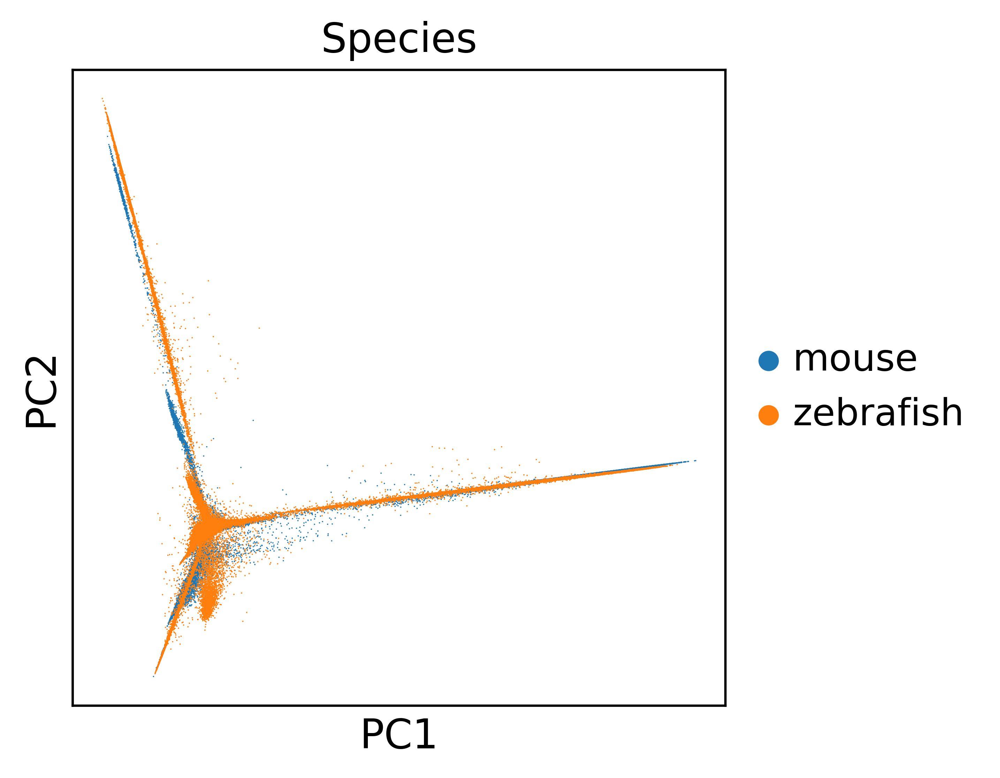

In [41]:
sc.pl.pca(adata, color="species", title="Species", save="pcaplot.pdf")


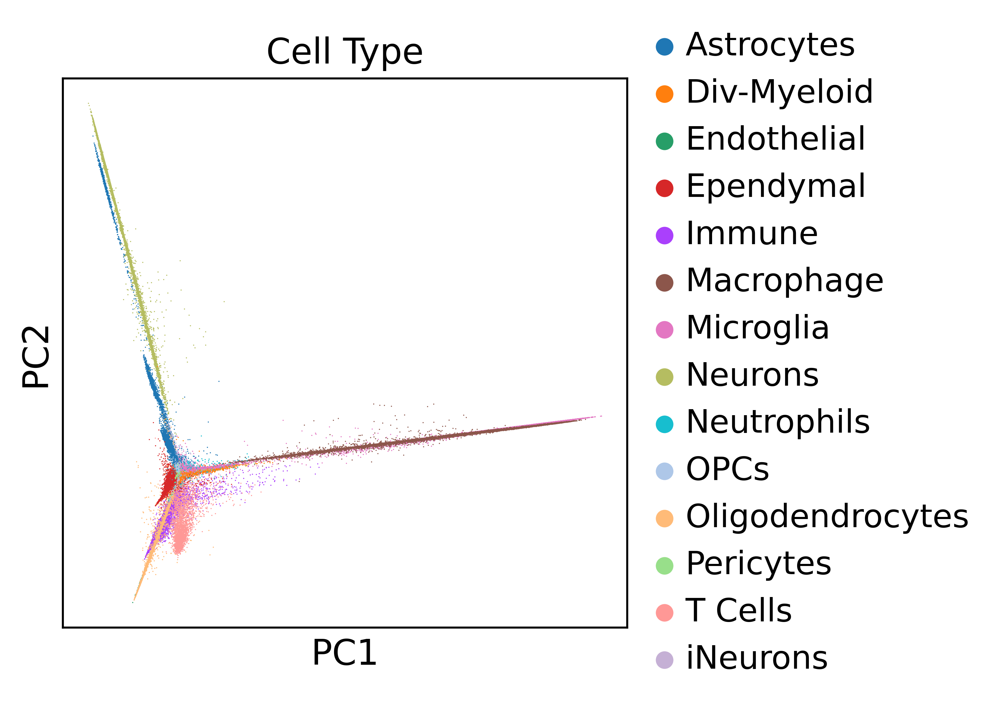

In [43]:
sc.pl.pca(adata, color="labels2", title="Cell Type",save="pcaplot_labelledCelltype.pdf")


In [45]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

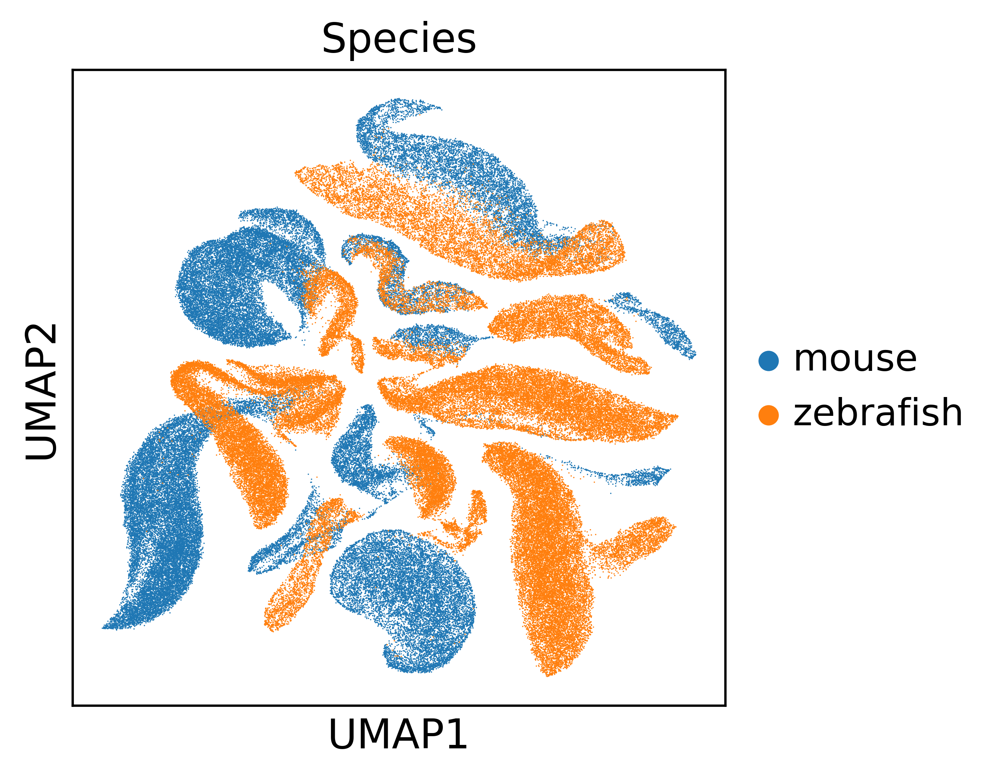

In [47]:
sc.pl.umap(adata, color="species", title="Species", save="umap_plot_species_labelled.pdf")

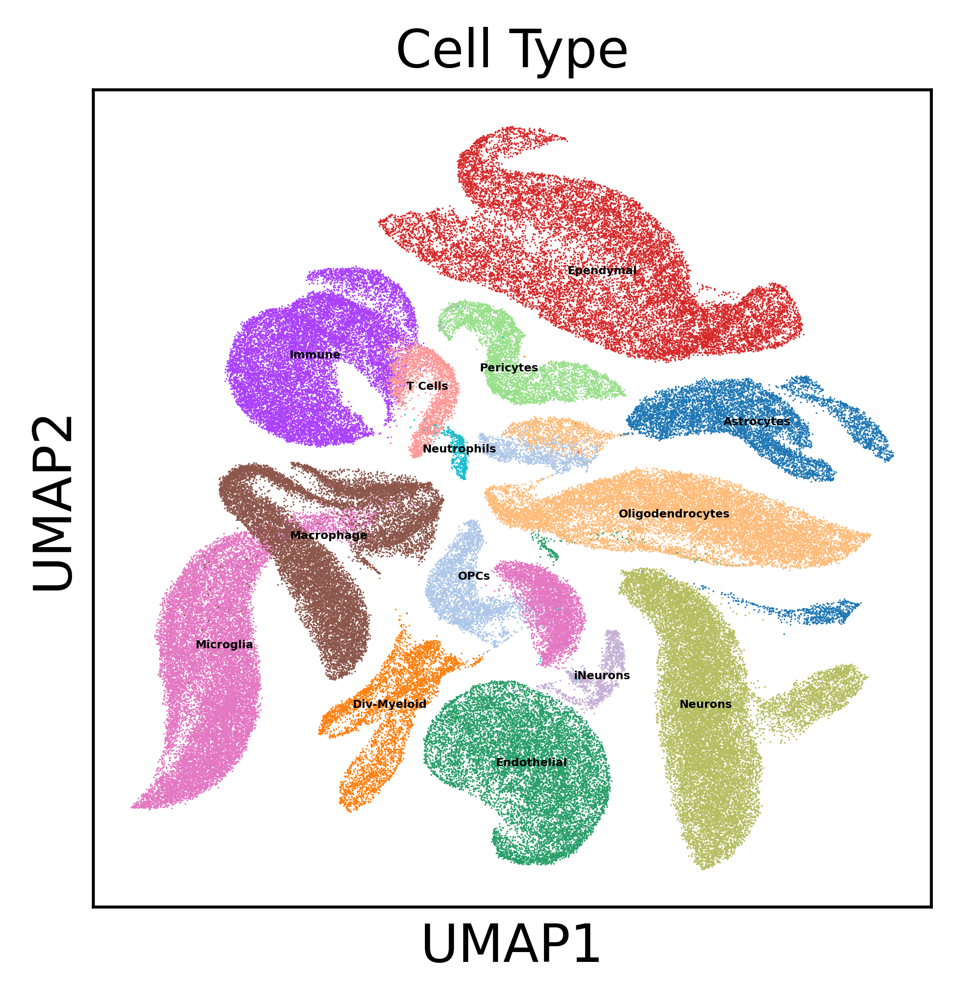

In [55]:
sc.pl.umap(adata, color="labels2", title="Cell Type",save="umapplot_labelledCelltype.pdf",legend_loc='on data',legend_fontsize=3)

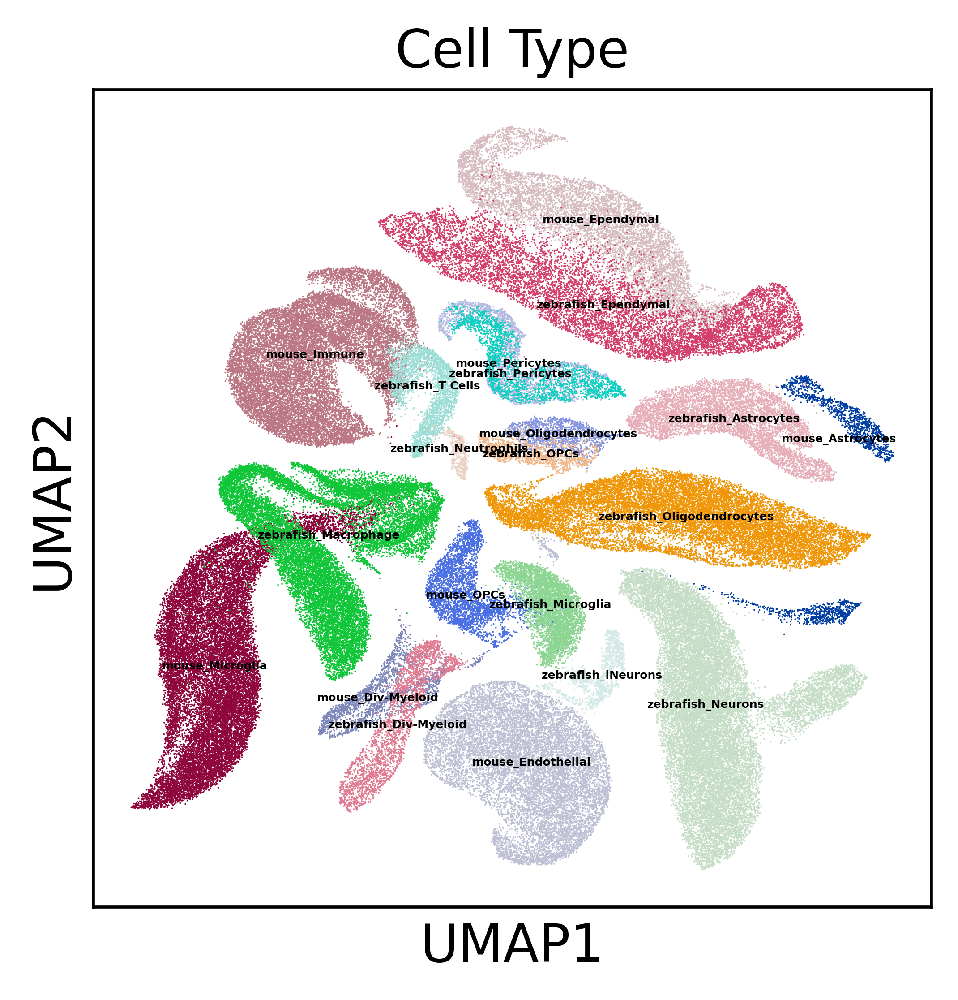

In [54]:
sc.pl.umap(adata, color="labels", title="Cell Type",save="umapplot_labelledCelltypeSpecies.pdf",legend_loc='on data',legend_fontsize=3)

## Performing macrogene differential expression

In [57]:
with open("test256_data_mouse_zebra_org_saturn_seed_0_genes_to_macrogenes.pkl", "rb") as f:
    macrogene_weights = pickle.load(f)

In [58]:
macrogene_weights

{'mouse_Sox17': array([6.8162007e-07, 1.1913360e-06, 1.9867941e-06, ..., 1.4298718e-06,
        9.6998201e-07, 5.7764714e-07], dtype=float32),
 'mouse_Rgs20': array([4.4727577e-07, 2.7013596e-06, 7.4552256e-05, ..., 8.5294056e-07,
        9.0305753e-07, 2.7552710e-07], dtype=float32),
 'mouse_Oprk1': array([7.4376635e-07, 8.9139928e-07, 1.0722622e-06, ..., 8.6963223e-07,
        7.1807534e-07, 2.9088832e-07], dtype=float32),
 'mouse_Rb1cc1': array([1.1128071e-06, 1.8691153e-06, 1.5440583e-05, ..., 6.7011246e-07,
        2.9044730e-07, 3.4719648e-07], dtype=float32),
 'mouse_Pcmtd1': array([1.2118256e-06, 9.9865599e-07, 2.5130777e-05, ..., 8.3724120e-07,
        2.4952166e-07, 5.1485887e-07], dtype=float32),
 'mouse_Sntg1': array([1.6614794e-06, 1.0466484e-06, 4.7755757e-06, ..., 5.7849559e-07,
        4.8467683e-07, 2.6936249e-07], dtype=float32),
 'mouse_Rrs1': array([9.7298937e-07, 2.4061817e-06, 8.7335247e-05, ..., 8.5322040e-07,
        6.8044841e-07, 5.5954808e-07], dtype=float32)

In [59]:
macrogene_adata = sc.AnnData(adata.obsm["macrogenes"])
macrogene_adata.obs = adata.obs

In [60]:
adata

AnnData object with n_obs × n_vars = 148321 × 256
    obs: 'labels', 'labels2', 'ref_labels', 'species'
    uns: 'pca', 'species_colors', 'labels2_colors', 'neighbors', 'umap', 'labels_colors'
    obsm: 'macrogenes', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [69]:
x=adata.obs
x.to_csv("meta.csv")

In [63]:
sc.tl.rank_genes_groups(macrogene_adata, groupby="labels2", groups=["Ependymal"], method="wilcoxon")

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: Astrocytes, Div-Myeloid, Endothelial, etc.
var_group_labels: Ependymal


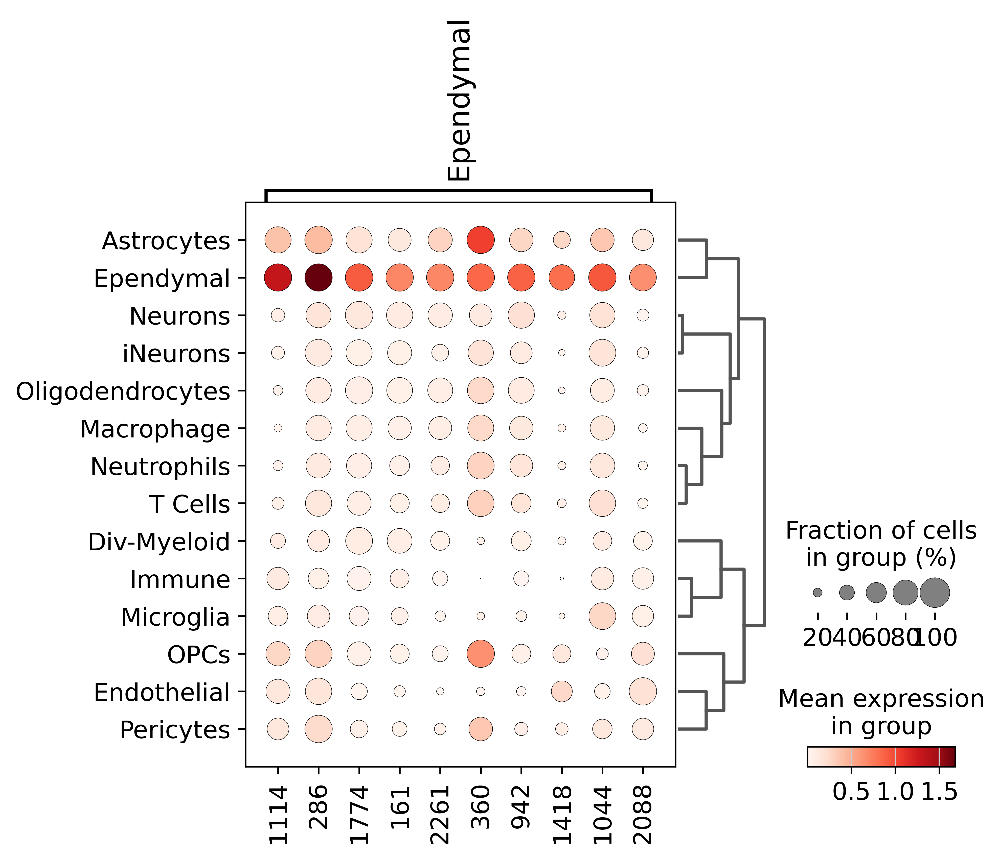

In [64]:
sc.pl.rank_genes_groups_dotplot(macrogene_adata)

In [70]:
ependymal_de_df = sc.get.rank_genes_groups_df(macrogene_adata, group="Ependymal").head(5)
ependymal_de_df

,names,scores,logfoldchanges,pvals,pvals_adj
0,1114,172.211853,4.726766,0.0,0.0
1,286,170.616623,4.891250,0.0,0.0
2,1774,162.765198,4.347949,0.0,0.0
3,161,161.753738,3.882452,0.0,0.0
4,2261,161.429001,3.984560,0.0,0.0


## Invesitigate macrogenes

In [71]:
def get_scores(macrogene):
    '''
    Given the index of a macrogene, return the scores by gene for that centroid
    '''
    scores = {}
    for (gene), score in macrogene_weights.items():
        scores[gene] = score[int(macrogene)]
    return scores

In [74]:
for macrogene in ependymal_de_df["names"]:
    print(f"Macrogene {macrogene}")
    display(pd.DataFrame(get_scores(macrogene).items(), columns=["gene", "weight"])\
            .sort_values("weight", ascending=False)\
            .head(10))

Macrogene 1114


,gene,weight
4843,mouse_Bbof1,0.476954
3929,mouse_Dzip1l,0.439444
3754,mouse_Ccdc153,0.420094
3812,mouse_Ccdc33,0.410295
5642,mouse_Spata24,0.407900
4650,mouse_Fam81b,0.373775
3365,mouse_Tsnaxip1,0.370231
9796,zebrafish_efcc1,0.362012
2918,mouse_Ccdc162,0.341685
1551,mouse_Ccdc30,0.320693


Macrogene 286


,gene,weight
2864,mouse_Adgb,0.310852
4326,mouse_Mycbpap,0.254057
4077,mouse_Fam161a,0.244863
1153,mouse_Zbbx,0.239620
1702,mouse_Cfap74,0.239446
4335,mouse_Ttll6,0.221593
2918,mouse_Ccdc162,0.209978
1800,mouse_Cc2d2a,0.208534
4000,mouse_Dlec1,0.203009
485,mouse_Cfap77,0.198490


Macrogene 1774


,gene,weight
1740,mouse_Ccdc146,0.564911
9082,zebrafish_cfap73,0.519463
1787,mouse_Ccdc96,0.493274
8907,zebrafish_ccdc114,0.478080
5937,mouse_Cfap43,0.465576
1093,mouse_Ccdc39,0.454874
9080,zebrafish_cfap58,0.434271
3350,mouse_Ccdc113,0.393902
9075,zebrafish_cfap100,0.391686
327,mouse_Nuf2,0.343833


Macrogene 161


,gene,weight
4943,mouse_Spef2,0.604499
3623,mouse_Epsti1,0.587588
548,mouse_Ccdc148,0.565661
14157,zebrafish_spef2,0.503354
3863,mouse_Mns1,0.457793
9084,zebrafish_cfap99,0.433614
12661,zebrafish_ribc2,0.376968
8916,zebrafish_ccdc173,0.352766
456,mouse_Enkur,0.351792
5682,mouse_Ccdc112,0.347758


Macrogene 2261


,gene,weight
9076,zebrafish_cfap157,0.673905
13512,zebrafish_si:dkey-188g12.1,0.511967
13112,zebrafish_si:ch211-163l21.10,0.386019
8926,zebrafish_ccdc65,0.351695
513,mouse_Cfap157,0.310105
8931,zebrafish_ccdc83,0.308009
9082,zebrafish_cfap73,0.289532
3754,mouse_Ccdc153,0.263426
8917,zebrafish_ccdc175,0.228608
5128,mouse_Ccdc65,0.216897
